In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import statistics as stat 

df = pd.read_csv('../../src/data/UN_pop_projections/UN_city_pop_projections_long.csv')
df.drop(columns=['Unnamed: 0','Region','Country_Code','City_Code','data_sources_UN'],inplace=True)
df  



,Country_or_area,City,City_Definition,Latitude,Longitude,year,population
0,Algeria,Annaba,Urban Agglomeration,36.900000,7.766670,1950,99.741
1,Algeria,Batna,City Proper,35.555970,6.174140,1950,13.046
2,Algeria,Blida,Urban Agglomeration,36.480781,2.831943,1950,33.970
3,Algeria,El Djazaïr (Algiers),Urban Agglomeration,36.752500,3.041970,1950,516.450
4,Algeria,El Djelfa,Urban Agglomeration,34.672790,3.263000,1950,10.450
...,...,...,...,...,...,...,...
19001,Zambia,Lusaka,Urban Agglomeration,-15.413374,28.277148,2035,5182.669
19002,Zambia,Ndola,City Proper,-12.958670,28.636590,2035,925.726
19003,Zimbabwe,Bulawayo,City Proper,-20.150000,28.583330,2035,874.479
19004,Zimbabwe,Chitungwiza,City Proper,-18.012740,31.075550,2035,552.027


In [6]:
df_selected = df[df['year'] == 1950]
for index, row in df_selected.iterrows():
    # Create a popup message 
    popup_message = f"{row['City']}, Population: {row['population']}"
    print(popup_message) 

Annaba, Population: 99.741
Batna, Population: 13.046
Blida, Population: 33.97
El Djazaïr  (Algiers), Population: 516.45
El Djelfa, Population: 10.45
Qacentina, Population: 88.001
Sétif, Population: 41.289
Wahran (Oran), Population: 268.935
Benguela, Population: 14.364
Cabinda, Population: 4.722
Cuito, Population: 8.632
Huambo, Population: 15.306
Lobito, Population: 23.027
Luanda, Population: 138.413
Lubango, Population: 11.555
Malanje, Population: 9.176
Uige, Population: 3.201
Abomey-Calavi, Population: 11.817
Cotonou, Population: 20.174
Djougou, Population: 2.365
Parakou, Population: 5.567
Bobo-Dioulasso, Population: 36.114
Ouagadougou, Population: 33.035
Bujumbura, Population: 18.825
Bafoussam, Population: 10.095
Bamenda, Population: 9.427
Douala, Population: 94.769
Garoua, Population: 7.289
Loum, Population: 4.802
Mbouda, Population: 4.552
Yaoundé, Population: 31.644
Bangui, Population: 42.202
N'Djaména, Population: 24.604
Brazzaville, Population: 83.39
Pointe-Noire, Population: 16.

In [35]:
import folium  
from folium.plugins import MarkerCluster

# fifth  


mapp = folium.Map(location=[28.0339, 1.6596], zoom_start=4)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(mapp)

# Loop through the dataframe and add markers to the map
for index, row in df.iterrows(): 
    # Create a popup message
    popup_message = f"{row['City']}, Population: {row['population']}"
    
    # Create a marker and add it to the marker cluster
    marker = folium.Marker(location=[row['Latitude'], row['Longitude']], popup=popup_message)
    marker.add_to(marker_cluster)

# Display the map
mapp  


In [4]:
import folium

mapp = folium.Map(location=[28.0339, 1.6596], zoom_start=4)

# Create a scatter plot for population in each city
for name, row in df.groupby('City'):
    folium.CircleMarker(
        location=[row['Latitude'].iloc[0], row['Longitude'].iloc[0]],
        radius=5,
        popup=f"{name}: {row['population'].iloc[0]}",
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(mapp)

# Display the map
mapp

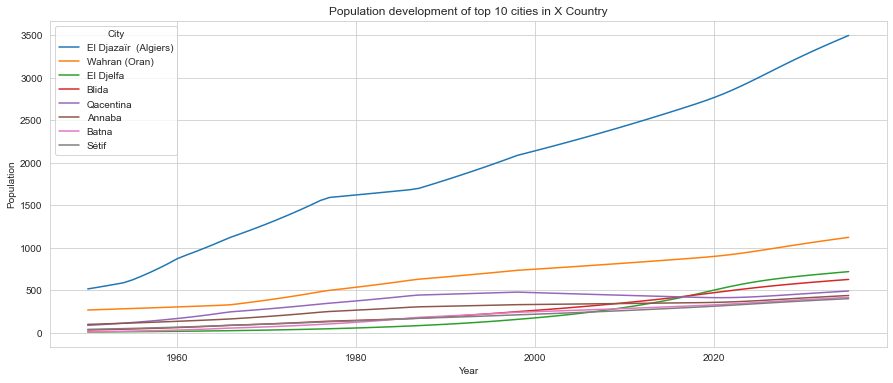

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# first 

df_country = df[df['Country_or_area'] == 'Algeria']

df_grouped = df_country.groupby(['City', 'year'])[['population']].sum().reset_index()

df_top_10 = df_grouped.sort_values(by=['year', 'population'], ascending=False).groupby('year').head(10)
 
sns.set_style("whitegrid") 
plt.figure(figsize=(15,6)) 
sns.lineplot(x='year', y='population', hue='City', data=df_top_10)

plt.title('Population development of top 10 cities in X Country')
plt.xlabel('Year')
plt.ylabel('Population')       

plt.show()  

<AxesSubplot:title={'center':'City Population - UN predictions vs model predictions '}, xlabel='year', ylabel='population'>

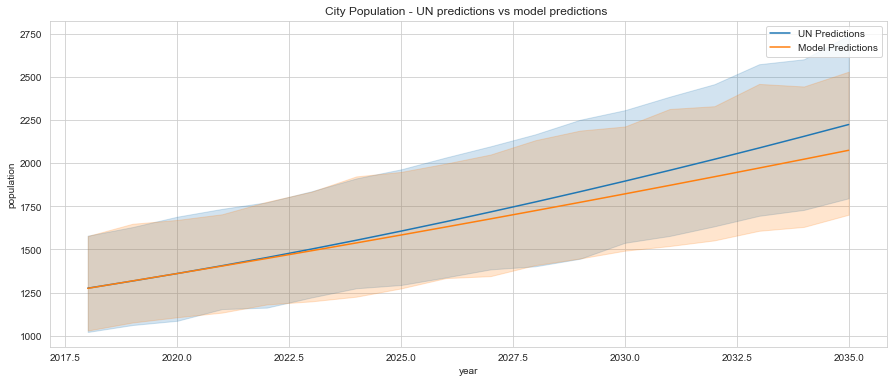

In [44]:
# second 

df_pred = pd.read_csv('../DataExplorationScripts/combined_dataset.csv')
df_pred = df_pred.filter(regex=r'^(?!.*_UN_prediction)' )
years = df_pred.year.unique()
new_columns = [col.replace('_prediction', '') for col in df_pred.columns]
df_pred.columns = new_columns
df_pred = pd.melt(df_pred, id_vars=['year'], var_name='City', value_name='population')
df_pred.rename(columns={'population':'population_pred'},inplace=True)
df_pred.set_index(['year', 'City'], inplace=True)

df = pd.read_csv('../../src/data/UN_pop_projections/UN_city_pop_projections_long.csv')

df_city_pop = df[['year','City','population']]
df_city_pop = df_city_pop[df_city_pop['year'].isin(years ) ]
df_city_pop.set_index(['year', 'City'], inplace=True) 
#len(df_city_pop.City.unique())

merged_df = df_city_pop.merge(df_pred, left_index=True, right_index=True)
merged_df.reset_index(inplace=True)


plt.figure(figsize=(15,6))
plt.title('City Population - UN predictions vs model predictions ')

city_name = 'Lusaka' 
city_data = merged_df[merged_df['City'] == city_name] 

sns.lineplot(data=merged_df, x='year', y='population', label='UN Predictions')
sns.lineplot(data=merged_df, x='year', y='population_pred', label='Model Predictions')

In [41]:
df_country_population = df.groupby(['Country_or_area', 'year'], as_index=False)['population'].sum()
df_country_population['population change'] = df_country_population['population'].pct_change() * 100  

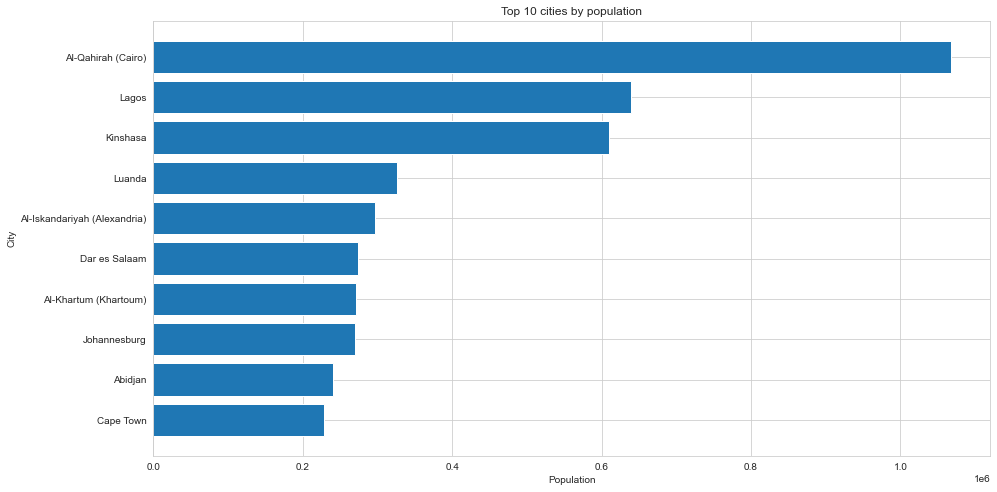

In [71]:
# third :  top 10 biggest city popu for  2035 for all of africa 


df = pd.read_csv('../../src/data/UN_pop_projections/UN_city_pop_projections_long.csv')
df.drop(columns=['Unnamed: 0','Region','Country_Code','City_Code','data_sources_UN'],inplace=True)
df[df['year']==2035 ] 


plt.figure(figsize=(15,8))
top_cities = df.groupby(['City'])['population'].sum().nlargest(10)
top_cities = top_cities.sort_values(ascending=True)
plt.barh(top_cities.index, top_cities.values)
plt.xlabel('Population') 
plt.ylabel('City') 
plt.title('Top 10 cities by population')
plt.show()

In [112]:
# # fourth plot : pop change for city by year (line chart)


# df_selected_country = df [df['Country_or_area']=='Algeria']
# df_grouped = df_selected_country.groupby(['City','year'])['population'].mean().reset_index()
# df_grouped.set_index(['City','year'],inplace=True) 
# df_grouped.reset_index(inplace=True)
# df_grouped.columns 

# plt.figure(figsize=(15,8))
# sns.lineplot(data=df_grouped, x='year', y='population', hue='City')
 
# plt.xlabel('Year') 
# plt.ylabel('Population')

# plt.title('Population evolution of cities of selected country X ')
# plt.show()

In [113]:
# # fourth plot : pop change for city by year (line chart)


# df_selected_country = df [df['Country_or_area']=='Algeria']
# df_grouped = df_selected_country.groupby(['City','year'])['population'].mean().reset_index()
# df_grouped.set_index(['City','year'],inplace=True) 
# df_grouped.reset_index(inplace=True) 
# #df_grouped.columns  
# df_grouped['population change'] = df_grouped['population'].pct_change() * 100 
# plt.figure(figsize=(15,8))
# sns.lineplot(data=df_grouped, x='year', y='population change', hue='City')

# plt.xlabel('Year')
# plt.ylabel('Population')

# plt.title('Population evolution of cities of selected country X ')
# plt.show()
